In [2]:
import os
from tqdm import tqdm
from glob import glob

import numpy as np
import pandas as pd

from sklearn.calibration import CalibratedClassifierCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.tree import plot_tree
from sklearn.model_selection import GridSearchCV, train_test_split

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import cv2
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_parquet("./processed_dfs/coin_features_df_extract_features_7_1.parquet")

y_col = "img_type"
X_cols = df.drop(columns = [y_col, "img"]).columns

X_train, X_test, y_train, y_test = train_test_split(df[X_cols], df[y_col], test_size = 0.15, random_state = 0)

print(f"Train set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")

dt_clf = DecisionTreeClassifier(class_weight = 'balanced', 
                                criterion = 'entropy',
                                max_depth = 4, 
                                max_features = 'sqrt', 
                                min_samples_leaf = 2,
                                random_state = 0)
dt_clf.fit(X_train[X_cols], y_train)

Train set shape: (2629, 96)
Test set shape: (464, 96)


DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=4, max_features='sqrt', min_samples_leaf=2,
                       random_state=0)

In [4]:
from extract_features_2 import extract_image_features, extract_features_single_image, crop_coins_from_background

def clf_coins(img_path):
    cropped_objects = crop_coins_from_background(img_path, type = 'local')

    temp = cv2.imread(img_path)
    temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)
    plt.imshow(temp)

    del temp
    
    fig, axs = plt.subplots(1, len(cropped_objects), figsize = (20, 8))
    for i, (cropped_obj, ax) in enumerate(zip(cropped_objects, axs)):
        pred_label = dt_clf.predict(extract_features_single_image(cropped_obj))    
        ax.imshow(cv2.cvtColor(cropped_obj, cv2.COLOR_BGR2RGB))
        ax.set_title(f'Object {i + 1}\nClass: {pred_label}')
        ax.axis('off')

    fig.tight_layout()
    plt.show()

In [5]:
def filter_background(image_path, color_space = 'HSV'):
    image = cv2.imread(image_path)
    image_color_converted = None
    lower_bound = upper_bound = None
    
    if color_space == 'HSV':
        image_color_converted = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        lower_bound = np.array([0, 0, 0])
        upper_bound = np.array([179, 255, 100])

    elif color_space == 'LAB':
        image_color_converted = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        lower_bound = np.array([0, 128, 128])
        upper_bound = np.array([255, 255, 255])

    elif color_space == 'HSL':
        image_color_converted = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
        lower_bound = np.array([0, 0, 0])
        upper_bound = np.array([179, 255, 100])

    elif color_space == 'HSB':
        image_color_converted = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        lower_bound = np.array([0, 0, 0])
        upper_bound = np.array([179, 255, 100])

    else:
        raise ValueError("Unsupported color space")

    mask = cv2.inRange(image_color_converted, lower_bound, upper_bound)
    result = cv2.cvtColor(cv2.bitwise_and(image, image, mask = mask), cv2.COLOR_BGR2RGB)

    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB), result

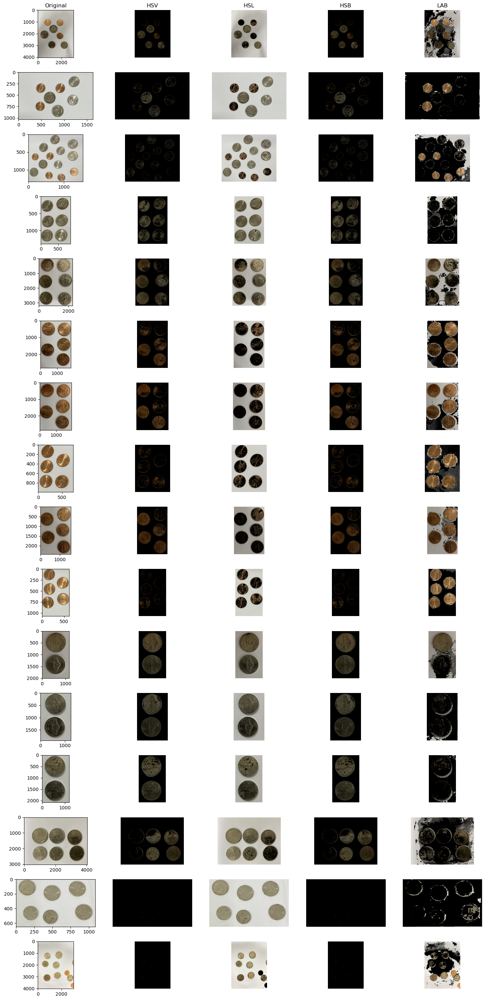

In [7]:
demo_pics = glob('./real_life_pic/*')
color_spaces = ['HSV', 'HSL', 'HSB', 'LAB']

fig, axs = plt.subplots(len(demo_pics), len(color_spaces) + 1, figsize = (15, 30))

for i, cs in enumerate(color_spaces):
    for j, img_file in enumerate(demo_pics):
        image, processed_img = filter_background(img_file, color_space = cs)
        
        axs[0, 0].set_title("Original")
        axs[j, 0].imshow(image)

        axs[0, i+1].set_title(cs)
        axs[j, i+1].imshow(processed_img)
        axs[j, i].axis('off')

fig.tight_layout()
plt.show()

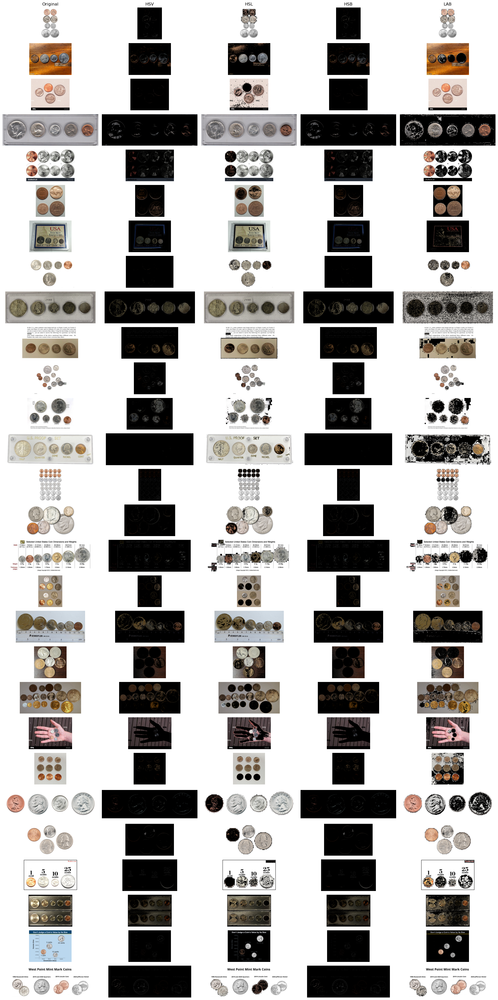

In [11]:
demo_pics = glob('./test/*')
color_spaces = ['HSV', 'HSL', 'HSB', 'LAB']

fig, axs = plt.subplots(len(demo_pics), len(color_spaces) + 1, figsize = (20, 40))

for i, cs in enumerate(color_spaces):
    for j, img_file in enumerate(demo_pics):
        image, processed_img = filter_background(img_file, color_space = cs)
        
        axs[0, 0].set_title("Original")
        axs[j, 0].imshow(image)
        axs[j, 0].axis('off')

        axs[0, i+1].set_title(cs)
        axs[j, i+1].imshow(processed_img)
        axs[j, i+1].axis('off')

fig.tight_layout()
plt.show()

In [14]:
def hsl_threshold(image_path, lower_bound = np.array([0, 0, 0]), upper_bound = np.array([179, 255, 100])):
    image = cv2.imread(image_path)
    hsl_img = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)

    mask = cv2.inRange(hsl_img, lower_bound, upper_bound)
    result = cv2.cvtColor(cv2.bitwise_and(image, image, mask = mask), cv2.COLOR_BGR2RGB)

    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB), result

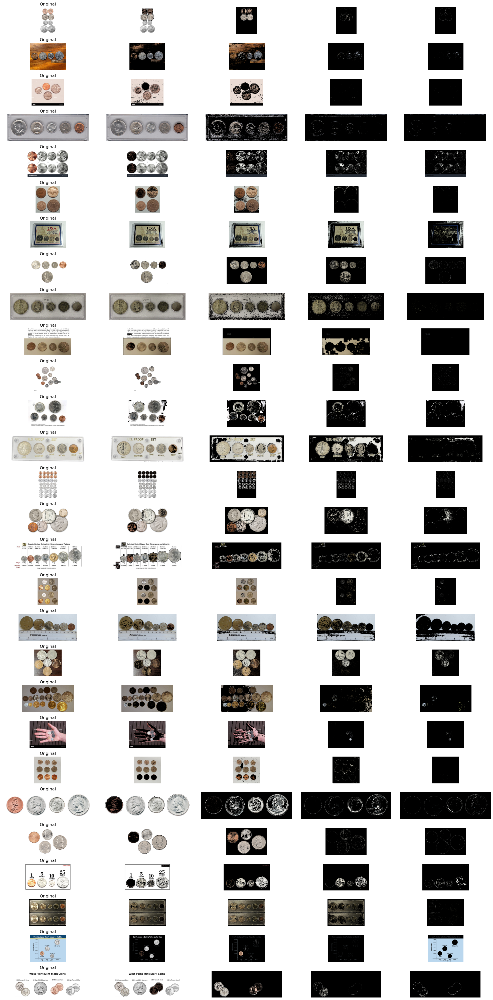

In [18]:
demo_pics = glob('./test/*')
lower_bounds = [np.array([0, 0, 0]), np.array([10, 10, 10]), np.array([20, 20, 20]), np.array([30, 30, 30])]
upper_bounds = [np.array([179, 255, 100]), np.array([200, 255, 150]), np.array([150, 255, 100]), np.array([150, 255, 200])]

fig, axs = plt.subplots(len(demo_pics), len(upper_bounds) + 1, figsize = (20, 40))

for i, (lower_bound, upper_bound) in enumerate(zip(lower_bounds, upper_bounds)):
    for j, img_file in enumerate(demo_pics):
        image, processed_img = hsl_threshold(img_file, lower_bound=lower_bound, upper_bound = upper_bound)

        if i == 0:
            axs[j, 0].set_title("Original")
            axs[j, 0].imshow(image)
            axs[j, 0].axis('off')

        axs[j, i + 1].imshow(processed_img)
        axs[j, i + 1].axis('off')

fig.tight_layout()
plt.show()

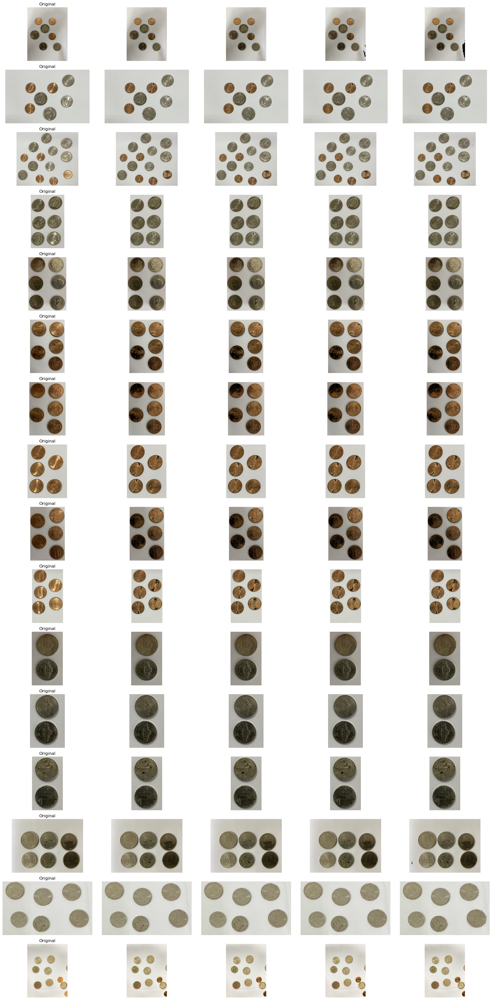

In [22]:
demo_pics = glob('./real_life_pic/*')
lower_bounds = [np.array([0, 0, 0]), np.array([0, 0, 0]), np.array([0, 0, 0]), np.array([0, 0, 0])]
upper_bounds = [np.array([200, 255, 179]), np.array([180, 255, 179]), np.array([170, 255, 179]), np.array([160, 255, 179])]

fig, axs = plt.subplots(len(demo_pics), len(upper_bounds) + 1, figsize = (20, 40))

for i, (lower_bound, upper_bound) in enumerate(zip(lower_bounds, upper_bounds)):
    for j, img_file in enumerate(demo_pics):
        image, processed_img = hsl_threshold(img_file, lower_bound=lower_bound, upper_bound = upper_bound)

        if i == 0:
            axs[j, 0].set_title("Original")
            axs[j, 0].imshow(image)
            axs[j, 0].axis('off')

        axs[j, i + 1].imshow(processed_img)
        axs[j, i + 1].axis('off')

fig.tight_layout()
plt.show()

In [23]:
def lab_threshold(image_path, lower_bound = np.array([0, 0, 0]), upper_bound = np.array([255, 255, 255])):
    image = cv2.imread(image_path)
    hsl_img = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    mask = cv2.inRange(hsl_img, lower_bound, upper_bound)
    result = cv2.cvtColor(cv2.bitwise_and(image, image, mask = mask), cv2.COLOR_BGR2RGB)

    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB), result

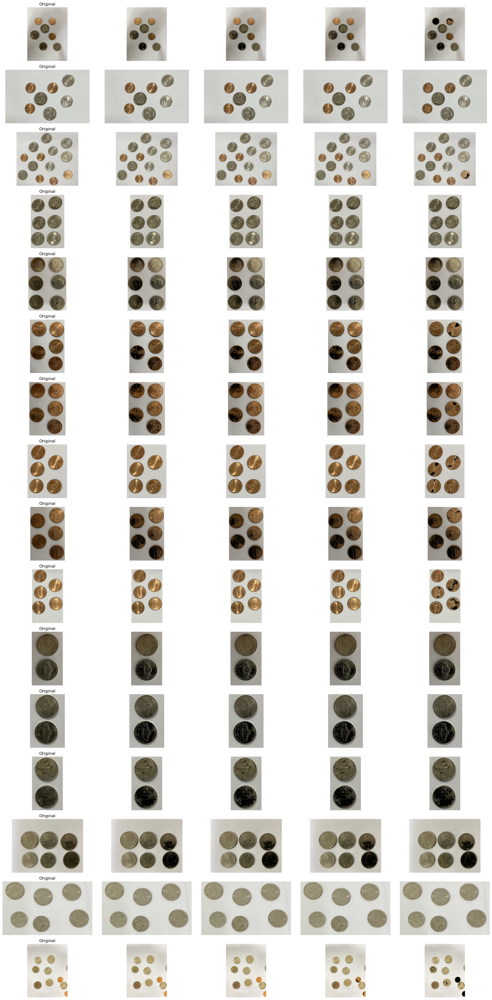

In [25]:
demo_pics = glob('./real_life_pic/*')
lower_bounds = [np.array([50, 50, 50]), np.array([50, 50, 50]), np.array([50, 50, 50]), np.array([50, 50, 50])]
upper_bounds = [np.array([255, 255, 255]), np.array([255, 200, 200]), np.array([255, 180, 180]), np.array([255, 160, 160])]

fig, axs = plt.subplots(len(demo_pics), len(upper_bounds) + 1, figsize = (20, 40))

for i, (lower_bound, upper_bound) in enumerate(zip(lower_bounds, upper_bounds)):
    for j, img_file in enumerate(demo_pics):
        image, processed_img = lab_threshold(img_file, lower_bound=lower_bound, upper_bound = upper_bound)

        if i == 0:
            axs[j, 0].set_title("Original")
            axs[j, 0].imshow(image)
            axs[j, 0].axis('off')

        axs[j, i + 1].imshow(processed_img)
        axs[j, i + 1].axis('off')

fig.tight_layout()
plt.show()